# Vergleich der Fehler bei verschiedenen Modellgrößen und Templates

In [1]:
from utils import constants

import os
import numpy as np
import matplotlib.pyplot as plt
import pycountry
import math
import folium

import pandas as pd
pd.set_option('display.max_colwidth', None)

### Importieren der Daten

In [2]:
dtype={'Population': 'Int64'}

path = './answers/'
file_name_template = '{model_key}-Instruct-{template_name}-{proccess_flag}'

dfs = {}

# für alle Modelle bzw. Größen von Llama 3.1 (8B, 70B, 405B) und 3.3 70B
for model_key, model_name in constants.models.items():
    model_number = '-'.join(model_key.split('-')[1:])
 
    file_name_json = file_name_template.format(model_key=model_key, template_name='json', proccess_flag='p')
    dfs[str(model_number + '-json')] = pd.read_csv(os.path.join(path, file_name_json + '.csv'), dtype=dtype)

    file_name_llm = file_name_template.format(model_key=model_key, template_name='original', proccess_flag='p_llm')
    dfs[str(model_number + '-llm')] = pd.read_csv(os.path.join(path, file_name_llm + '.csv'), dtype=dtype)

    file_name_regex = file_name_template.format(model_key=model_key, template_name='original', proccess_flag='p_regex')
    dfs[str(model_number + '-regex')] = pd.read_csv(os.path.join(path, file_name_regex + '.csv'), dtype=dtype)

### Anteil der fehlerhaften Antworten und durchschnittlicher Fehler

In [3]:
# dfs_keys = ['8B-json', '8B-llm', '8B-regex', '70B-json', '70B-llm', '70B-regex', '405B-json', '405B-llm', '405B-regex']
dfs_keys = dfs.keys()

table = pd.DataFrame({
    'Name': pd.Series(dtype='object'),
    'Anzahl der Anfragen': pd.Series(dtype='int64'),
    'Anzahl der Fehler': pd.Series(dtype='int64'),
    'Prozentualeranteil der Fehler': pd.Series(dtype='float64'),
    'Durchschnittlicher Fehler': pd.Series(dtype='float64'),
    'Standardabweichung': pd.Series(dtype='float64'),
})

table['Name'] = dfs_keys

ns = np.array([dfs[key].shape[0] for key in dfs_keys])
table['Anzahl der Anfragen'] = ns

nans = np.array([dfs[key]['Error'].isna().sum() for key in dfs_keys])
table['Anzahl der Fehler'] = nans

percentages = nans / ns * 100
table['Prozentualeranteil der Fehler'] = percentages

table['Durchschnittlicher Fehler'] = [np.nanmean(dfs[key]['Error']) for key in dfs_keys]

table['Standardabweichung'] = [np.nanstd(dfs[key]['Error']) for key in dfs_keys]

print("\"json\": Eine Anfrage, die das json-Format vorschreibt\n\"llm\": Die originale Anfrage, allerdings werden die Koordinaten aus der Antwort mithilfe eines LLM's extrahiert\n\"regex\": Die originale Anfrage mit der originalen Auswertung")

with pd.option_context('display.precision', 2):
    display(table[['Name', 'Anzahl der Anfragen', 'Prozentualeranteil der Fehler', 'Durchschnittlicher Fehler', 'Standardabweichung']])

"json": Eine Anfrage, die das json-Format vorschreibt
"llm": Die originale Anfrage, allerdings werden die Koordinaten aus der Antwort mithilfe eines LLM's extrahiert
"regex": Die originale Anfrage mit der originalen Auswertung


,Name,Anzahl der Anfragen,Prozentualeranteil der Fehler,Durchschnittlicher Fehler,Standardabweichung
0,3.1-8B-json,3527,0.40,755.67,2355.14
1,3.1-8B-llm,3527,11.88,369.93,1699.75
2,3.1-8B-regex,3527,87.64,1789.77,4409.02
3,3.1-70B-json,3527,0.20,628.56,2356.44
4,3.1-70B-llm,3527,7.03,320.09,1665.94
5,3.1-70B-regex,3527,92.46,1050.51,3347.66
6,3.1-405B-json,3527,0.37,388.31,1811.28
7,3.1-405B-llm,3527,9.27,300.54,1623.68
8,3.1-405B-regex,3527,87.52,891.55,3099.88
9,3.3-70B-json,3527,0.23,523.55,2141.83


### Anteil der Antworten, die 5% des Fehlers verursachen

In [4]:
df = dfs['3.1-405B-json']
error = df['Error'].sort_values(ascending=False)
error = error.reset_index(drop=True)

error_sum = np.sum(error)
limit = error_sum * 0.35

counter = 0
sum = 0

while sum < limit:
    sum += error[counter]
    counter += 1

    print(f"{limit:.2f}, {sum:.2f}, {counter}, {error[counter - 1]:.2f}")

print(f"Es sind {counter / error.shape[0] * 100:.2f} % der Anfragen für {sum / error_sum * 100:.2f} % des Fehlers verantwortlich!")

477576.90, 19751.30, 1, 19751.30
477576.90, 38561.37, 2, 18810.06
477576.90, 56822.67, 3, 18261.30
477576.90, 74773.69, 4, 17951.02
477576.90, 92561.19, 5, 17787.50
477576.90, 109769.71, 6, 17208.52
477576.90, 126925.39, 7, 17155.68
477576.90, 143726.52, 8, 16801.13
477576.90, 158742.32, 9, 15015.80
477576.90, 173005.65, 10, 14263.32
477576.90, 187265.40, 11, 14259.76
477576.90, 201418.72, 12, 14153.32
477576.90, 215258.46, 13, 13839.74
477576.90, 228871.71, 14, 13613.26
477576.90, 242059.69, 15, 13187.97
477576.90, 255168.59, 16, 13108.90
477576.90, 268083.83, 17, 12915.24
477576.90, 280693.06, 18, 12609.22
477576.90, 293265.78, 19, 12572.72
477576.90, 305823.24, 20, 12557.46
477576.90, 318250.16, 21, 12426.92
477576.90, 330522.47, 22, 12272.30
477576.90, 342743.68, 23, 12221.22
477576.90, 354529.80, 24, 11786.12
477576.90, 366252.05, 25, 11722.25
477576.90, 377946.13, 26, 11694.08
477576.90, 389471.46, 27, 11525.33
477576.90, 400883.60, 28, 11412.14
477576.90, 412174.82, 29, 11291.21

### Visualisierung

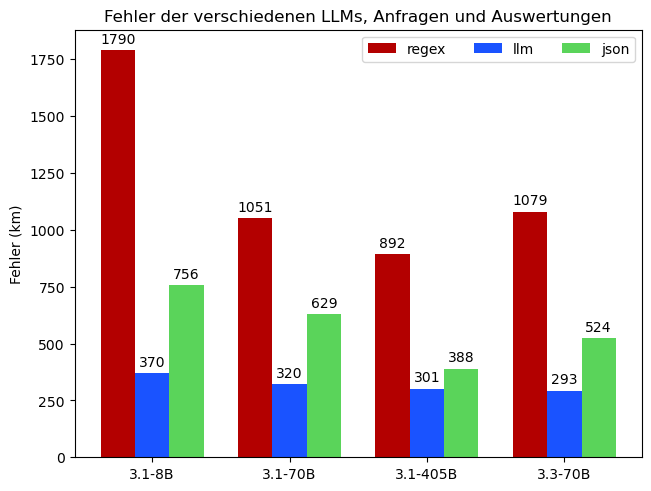

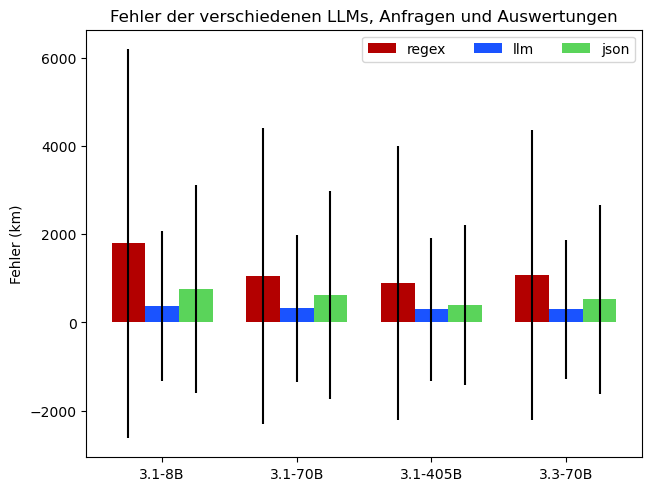

In [5]:
def get_mean_error(keys):
    return [np.nanmean(dfs[key]['Error']) for key in keys]

def get_std(keys):
    stds = [np.nanstd(dfs[key]['Error']) for key in keys]
    return stds


sizes = ('3.1-8B', '3.1-70B', '3.1-405B', '3.3-70B')

keys_regex = [key for key in dfs.keys() if key.endswith('regex')]
keys_llm = [key for key in dfs.keys() if key.endswith('llm')]
keys_json = [key for key in dfs.keys() if key.endswith('json')]

model_error = {
    'regex': (get_mean_error(keys_regex), get_std(keys_regex), '#b30000'),
    'llm': (get_mean_error(keys_llm), get_std(keys_llm), '#1a53ff'),
    'json': (get_mean_error(keys_json), get_std(keys_json), '#5ad45a'),
}

x = np.arange(len(sizes))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, (measurement, stds, color) in model_error.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, color=color, yerr=0)
    ax.bar_label(rects, padding=3, fmt="{:.0f}")
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Fehler (km)')
ax.set_title('Fehler der verschiedenen LLMs, Anfragen und Auswertungen')
ax.set_xticks(x + width, sizes)
ax.legend(loc='upper right', ncols=3)
# ax.set_ylim(0, 250)

plt.savefig('./results/size_template_error_no_std.pdf')


multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, (measurement, stds, color) in model_error.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, color=color, yerr=stds)
    # ax.bar_label(rects, padding=3, fmt="{:.1f}")
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Fehler (km)')
ax.set_title('Fehler der verschiedenen LLMs, Anfragen und Auswertungen')
ax.set_xticks(x + width, sizes)
ax.legend(loc='upper right', ncols=3)
# ax.set_ylim(0, 250)

plt.savefig('./results/size_template_error.pdf')
plt.show()

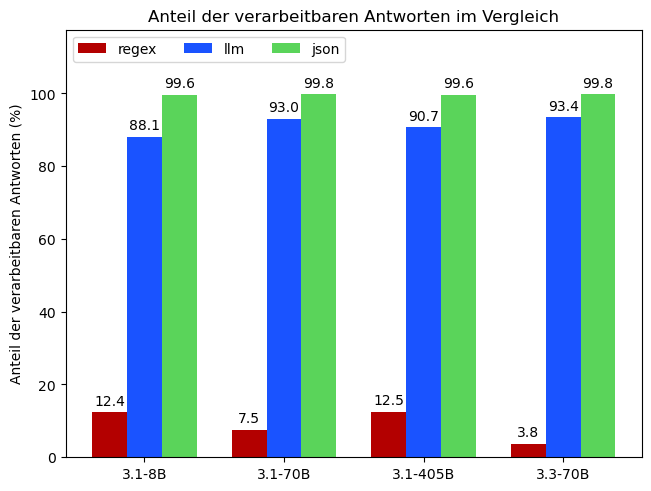

regex: 9.04 3.63
llm: 91.3 2.1
json: 99.7 0.09


In [6]:
def get_p(keys):
    # Der prozentuale Anteil der Antworten, die korrekt ausgewertet werden konnten
    ns = np.array([dfs[key].shape[0] for key in keys])
    nans = np.array([dfs[key]['Error'].isna().sum() for key in keys])
    percentages = (ns - nans) / ns * 100
    return percentages


sizes = ('3.1-8B', '3.1-70B', '3.1-405B', '3.3-70B')

keys_regex = [key for key in dfs.keys() if key.endswith('regex')]
keys_llm = [key for key in dfs.keys() if key.endswith('llm')]
keys_json = [key for key in dfs.keys() if key.endswith('json')]

error_regex = get_p(keys_regex)
error_llm = get_p(keys_llm)
error_json = get_p(keys_json)

model_error = {
    'regex': (error_regex, '#b30000'),
    'llm': (error_llm, '#1a53ff'),
    'json': (error_json, '#5ad45a'),
}

x = np.arange(len(sizes))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, (measurement, color) in model_error.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, color=color)
    ax.bar_label(rects, padding=3, fmt="{:.1f}")
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Anteil der verarbeitbaren Antworten (%)')
ax.set_title('Anteil der verarbeitbaren Antworten im Vergleich')
ax.set_xticks(x + width, sizes)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 117.5)

plt.savefig('./results/size_template_p.pdf')
plt.show()

print("regex:", round(np.mean(error_regex), 2), round(np.std(error_regex), 2))
print("llm:", round(np.mean(error_llm), 2), round(np.std(error_llm), 2))
print("json:", round(np.mean(error_json), 2), round(np.std(error_json), 2))

# Karte

In [7]:
df = dfs['3.1-405B-json'].sort_values('Error')

# Gruppengröße bestimmen und Farben festlegen
colors = ['darkgreen', 'green', 'lightgreen', 'orange', 'lightred', 'red', 'darkred']
number_per_color = int(df.shape[0] / len(colors)) + 1
group_index = 0

# Karte und Gruppen erstellen
m = folium.Map(location=[51.9579, 7.6151])

group_0 = folium.FeatureGroup("perfekt").add_to(m)
group_1 = folium.FeatureGroup("sehr gut").add_to(m)
group_2 = folium.FeatureGroup("gut").add_to(m)
group_3 = folium.FeatureGroup("okay").add_to(m)
group_4 = folium.FeatureGroup("etwas schlechter").add_to(m)
group_5 = folium.FeatureGroup("schlecht").add_to(m)
group_6 = folium.FeatureGroup("sehr schlecht").add_to(m)

groups = [group_0, group_1, group_2, group_3, group_4, group_5, group_6]

# Jeden Datenpunkt einzeichnen
for counter, (index, row) in enumerate(df.iterrows()):

    # Muss die nächste Gruppe angefangen werden?
    if counter % number_per_color == 0 and counter > 0:
        group_index += 1

    # Daten extrahieren
    coords = [row['Latitude'], row['Longitude']]
    coords_llm = [row['LatitudeLLM'], row['LongitudeLLM']]
    error = f"{row['Error']:.2f} km"

    # Beschriftung
    country_code = row['Country']
    country = dict(pycountry.countries.lookup(country_code))['name']

    location_name = f"{row['City']}, {country}"
    location_name_llm = 'LLM - ' + location_name

    # Nur Datenpunkte hinzufügen, die keine 'leeren' Werte haben
    if math.isnan(coords[0]) or math.isnan(coords[1]) or math.isnan(coords_llm[0]) or math.isnan(coords_llm[1]):
        continue

    group_color = colors[group_index]
    group = groups[group_index]

    # Echte Position
    folium.Marker(
        location=coords,
        tooltip=location_name,
        icon=folium.Icon(color=group_color)
    ).add_to(group)

    # LLM Position
    folium.Marker(
        location=coords_llm,
        tooltip=location_name_llm,
        icon=folium.Icon(color=group_color, icon='glyphicon-flag')
    ).add_to(group)

    # Strecke zwischen den Positionen
    trail_coordinates = [
        coords, coords_llm
    ]

    folium.PolyLine(
        trail_coordinates,
        tooltip=error,
        color='#FFCCCB' if group_color == 'lightred' else group_color # Warum kann man keine Linien in 'lightred' zeichnen... aber Punkte...
    ).add_to(group)
    
folium.LayerControl().add_to(m) # Möglichkeit die verschiedenen Gruppen auszublenden
# m.save("Test.html")
m

In [8]:
df = dfs['3.1-405B-json'].sort_values('Error')
df = df[df['City'] == 'munster']

# Karte und Gruppen erstellen
m = folium.Map(location=[51.9579, 7.6151])

# Jeden Datenpunkt einzeichnen
for (index, row) in df.iterrows():
    # Daten extrahieren
    coords = [row['Latitude'], row['Longitude']]
    coords_llm = [row['LatitudeLLM'], row['LongitudeLLM']]
    error = f"{row['Error']:.2f} km"

    # Beschriftung
    country_code = row['Country']
    country = dict(pycountry.countries.lookup(country_code))['name']

    location_name = f"{row['City']}, {country}"
    location_name_llm = 'LLM - ' + location_name

    # Nur Datenpunkte hinzufügen, die keine 'leeren' Werte haben
    if math.isnan(coords[0]) or math.isnan(coords[1]) or math.isnan(coords_llm[0]) or math.isnan(coords_llm[1]):
        continue

    # Echte Position
    folium.Marker(
        location=coords,
        tooltip=location_name,
        icon=folium.Icon(color='orange')
    ).add_to(m)

    # LLM Position
    folium.Marker(
        location=coords_llm,
        tooltip=location_name_llm,
        icon=folium.Icon(icon='glyphicon-flag', color='orange')
    ).add_to(m)

    # Strecke zwischen den Positionen
    trail_coordinates = [
        coords, coords_llm
    ]

    folium.PolyLine(
        trail_coordinates,
        tooltip=error,
        color='orange'
    ).add_to(m)
    
folium.LayerControl().add_to(m) # Möglichkeit die verschiedenen Gruppen auszublenden
# m.save("Test.html")
m

# Violin-Plot

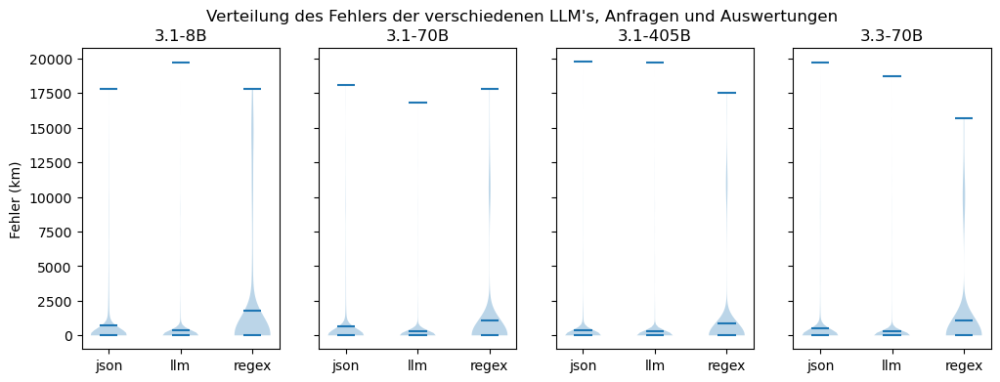

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 4), sharey=True)
(ax_1_8, ax_1_70, ax_1_405, ax_3_70) = axes

# Beschriftungen
fig.suptitle("Verteilung des Fehlers der verschiedenen LLM\'s, Anfragen und Auswertungen")

titles = ['3.1-8B', '3.1-70B', '3.1-405B', '3.3-70B']

for (ax, title) in zip(axes, titles):
    ax.set_title(title)

    # Daten plotten
    core = ax.violinplot([dfs[key]['Error'].dropna() for key in dfs.keys() if key.startswith(title)], showmeans=True)
    core['cbars'].set_linewidth(0) # vertikale Linie ausblenden -> Datenpunkte bei ca. 12k km werden sonst kaum sichtbar, sind aber relevant

ax_1_8.set_ylabel('Fehler (km)')

# Achsenbeschriftungen ändern
for ax in axes:
    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels(['json', 'llm', 'regex'])

plt.savefig('./results/size_template_violin.pdf')
plt.show()

# Histogramm

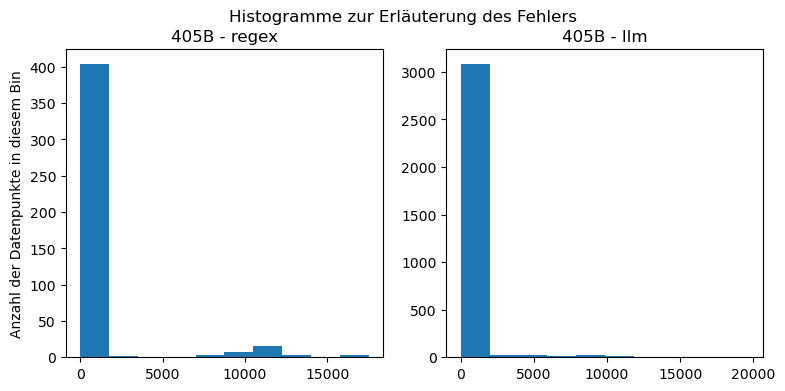

In [10]:
error_405_regex = dfs['3.1-405B-regex']['Error'].dropna().values
error_405_llm = dfs['3.1-405B-llm']['Error'].dropna().values

fig, (ax405_regex, ax405_llm) = plt.subplots(nrows=1, ncols=2, figsize=(9, 4), sharey=False)

# Beschriftungen
fig.suptitle("Histogramme zur Erläuterung des Fehlers")

ax405_regex.set_title('405B - regex')
ax405_llm.set_title('405B - llm')

ax405_regex.set_ylabel('Anzahl der Datenpunkte in diesem Bin')

# bins = np.histogram_bin_edges(np.concatenate((error_405_llm, error_405_regex)), bins='auto')

ax405_regex.hist(error_405_regex, bins=10)
ax405_llm.hist(error_405_llm, bins=10)

plt.savefig('./results/size_template_hist.pdf')
plt.show()